# Notebook for preprocessing of the data set

## Importing the necessary modules

In [1]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from sklearn.impute import KNNImputer
import plotly.express as px

## Loading the raw data set

In [2]:
data = pd.read_csv("..\..\Data\weatherAUS.csv")

In [3]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

## Transforming nonnumerical variables into numerical ones

### The variables concering wind direction are transformed into a cyclic variables

In [4]:
direction_to_angle = {'N': 0, 'NNE': np.pi/8, 'NE': (np.pi*2)/8, 'ENE': (np.pi*3)/8, 
                      'E': (np.pi*4)/8, 'ESE': (np.pi*5)/8, 'SE': (np.pi*6)/8, 'SSE': (np.pi*7)/8,
                      'S': np.pi, 'SSW': (np.pi*9)/8, 'SW': (np.pi*10)/8, 'WSW': (np.pi*11)/8,
                      'W': (np.pi*12)/8, 'WNW': (np.pi*13)/8, 'NW': (np.pi*14)/8, 'NNW': (np.pi*15)/8}
def circular_encode(direction):
    """
    The function associates to each direction interpreted as angle the corresponding x- and y-coordinates
    """
    angle = direction_to_angle[direction]
    return np.sin(angle), np.cos(angle)


In [5]:
# Three varibales concering the wind direction are replaced by a corresponding cyclic representation

data['WindGustDir_x'] = data['WindGustDir'].apply(lambda x: circular_encode(x)[1] if(pd.notnull(x)) else x)
data['WindGustDir_y'] = data['WindGustDir'].apply(lambda x: circular_encode(x)[0] if(pd.notnull(x)) else x)

data['WindDir9am_x'] = data['WindDir9am'].apply(lambda x: circular_encode(x)[1] if(pd.notnull(x)) else x)
data['WindDir9am_y'] = data['WindDir9am'].apply(lambda x: circular_encode(x)[0] if(pd.notnull(x)) else x)

data['WindDir3pm_x'] = data['WindDir3pm'].apply(lambda x: circular_encode(x)[1] if(pd.notnull(x)) else x)
data['WindDir3pm_y'] = data['WindDir3pm'].apply(lambda x: circular_encode(x)[0] if(pd.notnull(x)) else x)

data = data.drop(['WindGustDir', 'WindDir9am', 'WindDir3pm'], axis = 1)

### Replacing boolean Values with 1 and 0.

In [6]:
data = data.replace({'Yes': 1, 'No': 0, 'NaN': 'NaN'})

C:\Users\Maximilian Holdt\AppData\Local\Temp\ipykernel_18292\3563205971.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data = data.replace({'Yes': 1, 'No': 0, 'NaN': 'NaN'})


## Dealing with missing values

### The highest values for evaporation are divided up on the empty values before them

In [7]:
# Find the rows with the highest value in Evaporation.
print(data.sort_values(by = 'Evaporation').dropna(subset = ['Evaporation']).tail(10))

              Date       Location  MinTemp  MaxTemp  Rainfall  Evaporation  \
107599  2014-10-28        Woomera     11.0     26.7       0.0         68.8   
105949  2010-01-23        Woomera     17.0     33.1       0.0         70.0   
107968  2015-11-01        Woomera     21.0     34.2       0.0         70.4   
105965  2010-02-08        Woomera     25.7     39.7       0.0         72.2   
23954   2017-01-03  NorfolkIsland     19.4     26.1       0.0         74.8   
107290  2013-12-23        Woomera     14.4     27.2       3.0         77.3   
105935  2010-01-09        Woomera     26.6     41.7       0.0         81.2   
106968  2013-01-07        Woomera     24.6     45.3       0.0         82.4   
8831    2016-11-11          Cobar     19.1     35.3       0.0         86.2   
42358   2016-12-19    Williamtown     15.3     23.9      58.2        145.0   

        Sunshine  WindGustSpeed  WindSpeed9am  WindSpeed3pm  ...  Temp9am  \
107599       NaN           33.0          24.0          19.0  ...

The ids with the four highest Evaporation (over 80) are 42358, 8831, 106968, 105935.
For everyone of these ids the number of NaN-values before them is found

In [8]:
evap_list_1 = list(range(42339, 42359))
print(data.loc[evap_list_1])

             Date     Location  MinTemp  MaxTemp  Rainfall  Evaporation  \
42339  2016-11-30  Williamtown     17.3     26.7       0.0          7.0   
42340  2016-12-01  Williamtown     13.6     32.0       NaN          NaN   
42341  2016-12-02  Williamtown     15.1     34.9       NaN          NaN   
42342  2016-12-03  Williamtown     21.3     26.5       NaN          NaN   
42343  2016-12-04  Williamtown     17.0     28.3       NaN          NaN   
42344  2016-12-05  Williamtown     21.3     35.1       NaN          NaN   
42345  2016-12-06  Williamtown     21.2     27.0       NaN          NaN   
42346  2016-12-07  Williamtown     18.2     24.1       NaN          NaN   
42347  2016-12-08  Williamtown     16.8     32.3       NaN          NaN   
42348  2016-12-09  Williamtown     18.7     27.8       NaN          NaN   
42349  2016-12-10  Williamtown     16.9     24.2       NaN          NaN   
42350  2016-12-11  Williamtown     16.5     28.6       NaN          NaN   
42351  2016-12-12  Willia

In [9]:
evap_list_2 = list(range(8819, 8832))
print(data.loc[evap_list_2])

            Date Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  \
8819  2016-10-30    Cobar     21.2     29.1       0.0         10.6       NaN   
8820  2016-10-31    Cobar      9.9     20.6       1.8          NaN       NaN   
8821  2016-11-01    Cobar      7.1     24.5       0.2          NaN       NaN   
8822  2016-11-02    Cobar      7.6     25.2       0.0          NaN       NaN   
8823  2016-11-03    Cobar     11.5     28.3       0.0          NaN       NaN   
8824  2016-11-04    Cobar     13.4     31.3       0.0          NaN       NaN   
8825  2016-11-05    Cobar     15.2     23.0       0.0          NaN       NaN   
8826  2016-11-06    Cobar      9.3     27.0       0.0          NaN       NaN   
8827  2016-11-07    Cobar     14.5     34.3       0.0          NaN       NaN   
8828  2016-11-08    Cobar     19.9     30.8       0.0          NaN       NaN   
8829  2016-11-09    Cobar     15.3     28.0       9.0          NaN       NaN   
8830  2016-11-10    Cobar     15.0     3

In [10]:
evap_list_3 = list(range(106964, 106969))
print(data.loc[evap_list_3])

              Date Location  MinTemp  MaxTemp  Rainfall  Evaporation  \
106964  2013-01-03  Woomera     22.9     41.9       0.0         16.0   
106965  2013-01-04  Woomera     23.9     46.1       0.0          NaN   
106966  2013-01-05  Woomera     22.7     41.7       0.0          NaN   
106967  2013-01-06  Woomera     20.3     44.8       0.0          NaN   
106968  2013-01-07  Woomera     24.6     45.3       0.0         82.4   

        Sunshine  WindGustSpeed  WindSpeed9am  WindSpeed3pm  ...  Temp9am  \
106964       NaN           37.0          26.0          11.0  ...     31.7   
106965       NaN           41.0          20.0          20.0  ...     35.3   
106966       NaN           69.0          28.0          31.0  ...     25.2   
106967       NaN           57.0          28.0          28.0  ...     26.1   
106968       NaN           74.0          17.0          13.0  ...     31.8   

        Temp3pm  RainToday  RainTomorrow  WindGustDir_x  WindGustDir_y  \
106964     40.0        0.0    

In [11]:
evap_list_4 = list(range(105930, 105936))
print(data.loc[evap_list_4])

              Date Location  MinTemp  MaxTemp  Rainfall  Evaporation  \
105930  2010-01-04  Woomera     16.2     34.4       0.0         14.0   
105931  2010-01-05  Woomera     19.2     37.2       0.0          NaN   
105932  2010-01-06  Woomera     22.5     39.4       0.0          NaN   
105933  2010-01-07  Woomera     25.1     38.8       0.0          NaN   
105934  2010-01-08  Woomera     23.9     40.9       0.0          NaN   
105935  2010-01-09  Woomera     26.6     41.7       0.0         81.2   

        Sunshine  WindGustSpeed  WindSpeed9am  WindSpeed3pm  ...  Temp9am  \
105930       NaN           33.0          20.0           6.0  ...     23.8   
105931       NaN           44.0           7.0          11.0  ...     27.2   
105932       NaN           48.0          26.0          13.0  ...     28.4   
105933       NaN           41.0          24.0           6.0  ...     29.1   
105934       NaN           44.0          20.0          17.0  ...     32.6   
105935      13.2           48.0  

In [12]:
print('Before the value 145 in row 42358 there are 18 NaN, i. e. the mean becomes', round(145/19,1))
print('Before the value 86.2 in row 8831 there are 11 NaN, i. e. the mean becomes', round(86.2/12, 1))
print('Before the value 82.4 in row 106968 there are 3 NaN, i. e. the mean becomes', round(82.4/4, 1))
print('Before the value 81.2 in row 105935 there are 4 NaN, i. e. the mean becomes', round(81.2/5, 1))

Before the value 145 in row 42358 there are 18 NaN, i. e. the mean becomes 7.6
Before the value 86.2 in row 8831 there are 11 NaN, i. e. the mean becomes 7.2
Before the value 82.4 in row 106968 there are 3 NaN, i. e. the mean becomes 20.6
Before the value 81.2 in row 105935 there are 4 NaN, i. e. the mean becomes 16.2


In [13]:
# The NaN-values and the highest values are replaced by the mean.

data.loc[evap_list_1[1:], 'Evaporation']= round(145/19, 1)
data.loc[evap_list_2[1:], 'Evaporation']= round(86.2/12, 1)
data.loc[evap_list_3[1:], 'Evaporation']= round(82.4/4, 1)
data.loc[evap_list_4[1:], 'Evaporation']= round(81.2/5, 1)


### Droping rows with missing values in the Target variable

In [14]:
data = data.dropna(subset = ['RainTomorrow'])

### Subsection of plots of the data before imputing

In [15]:
#Create additional columns for Rainfall the next day and the previous day to highlight the correlation

data_enlarged = pd.DataFrame([])
for locat in data['Location'].unique():
    data_locat = data[data['Location']==locat].sort_values(by = 'Date')
    data_locat['Rainfall_yesterday'] = data_locat['Rainfall'].shift(periods = 1)
    data_locat['Rainfall_tomorrow'] = data_locat['Rainfall'].shift(periods = -1)
    data_enlarged = pd.concat([data_enlarged, data_locat])

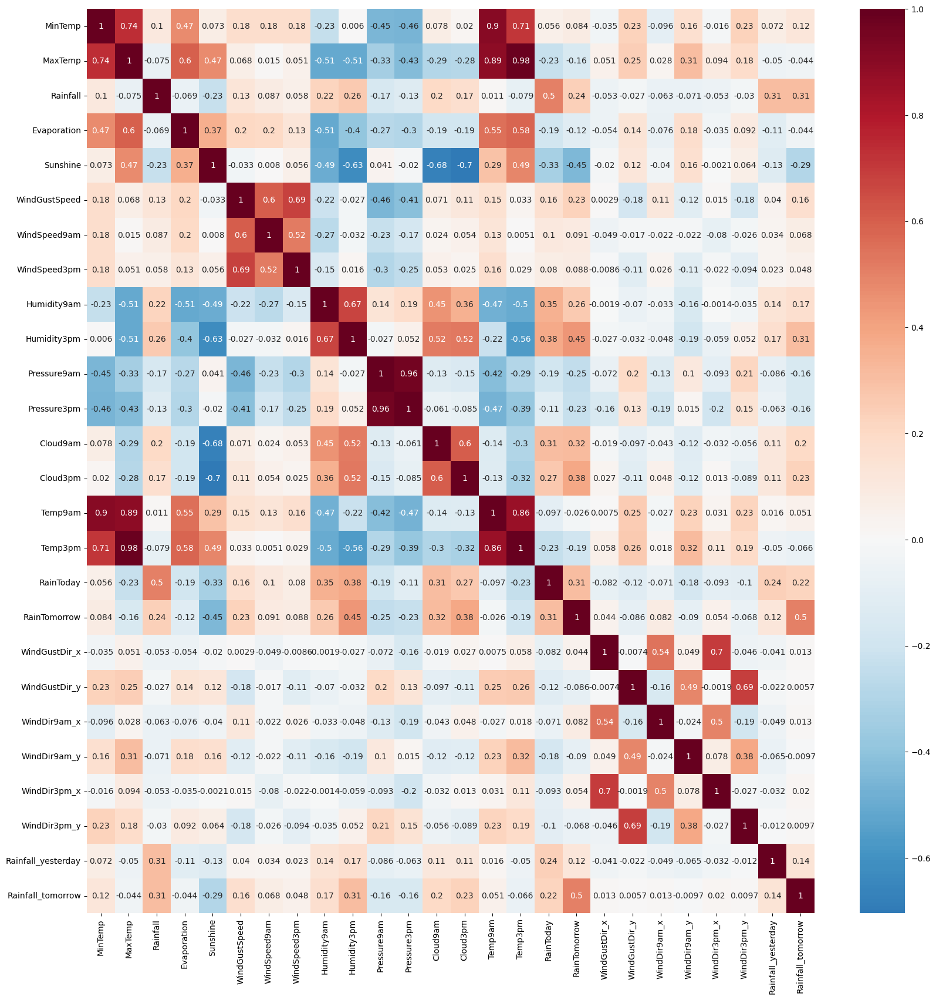

In [16]:
data_enlarged_quant = data_enlarged.drop(['Date', 'Location'], axis = 1)
plt.figure(figsize=(20,20))
sns.heatmap(data_enlarged_quant.corr(),  annot=True, cmap="RdBu_r", center =0)
plt.show()

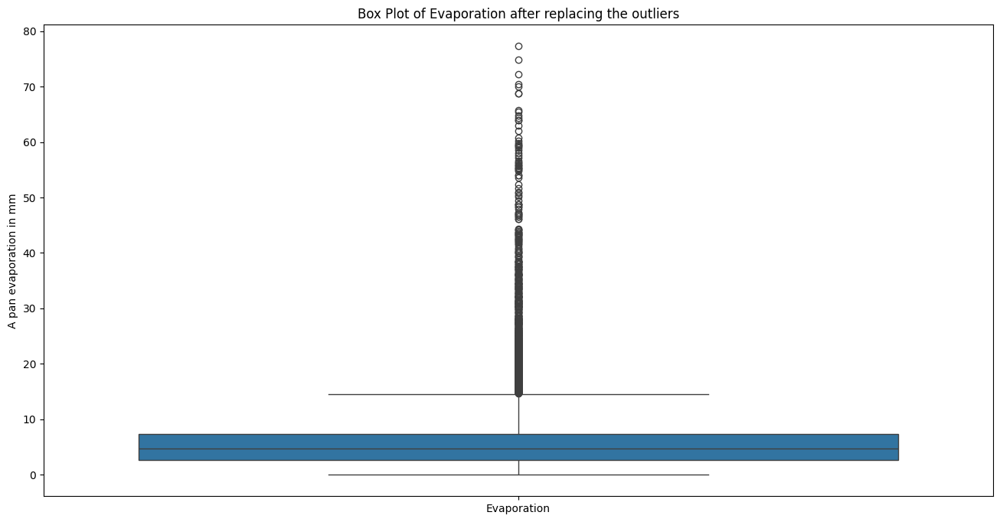

In [18]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=data[['Evaporation']])
plt.title('Box Plot of Evaporation after replacing the outliers')
plt.ylabel('A pan evaporation in mm')
plt.show()

### Missing values in the rest of variables are filled in with a KNN imputation.

In [19]:
# KNN imputation only works with numerical data so 'Date' and 'Location' are droped first

data_quant = data.drop(['Date', 'Location'], axis = 1)
imputer = KNNImputer(n_neighbors=5)
data_quant = imputer.fit_transform(data_quant)

data_quant = pd.DataFrame(data_quant, columns=data.drop(['Date', 'Location'], axis = 1).columns)
print(data_quant.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   MinTemp        142193 non-null  float64
 1   MaxTemp        142193 non-null  float64
 2   Rainfall       142193 non-null  float64
 3   Evaporation    142193 non-null  float64
 4   Sunshine       142193 non-null  float64
 5   WindGustSpeed  142193 non-null  float64
 6   WindSpeed9am   142193 non-null  float64
 7   WindSpeed3pm   142193 non-null  float64
 8   Humidity9am    142193 non-null  float64
 9   Humidity3pm    142193 non-null  float64
 10  Pressure9am    142193 non-null  float64
 11  Pressure3pm    142193 non-null  float64
 12  Cloud9am       142193 non-null  float64
 13  Cloud3pm       142193 non-null  float64
 14  Temp9am        142193 non-null  float64
 15  Temp3pm        142193 non-null  float64
 16  RainToday      142193 non-null  float64
 17  RainTomorrow   142193 non-nul

In [20]:
# 'Date' and 'Location' are added again

data_imp = data_quant
data_imp[['Date', 'Location']] = data.reset_index(drop=True)[['Date', 'Location']] #reset_index is neccessary as the imputation also resets the index
print(data_imp.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 26 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   MinTemp        142193 non-null  float64
 1   MaxTemp        142193 non-null  float64
 2   Rainfall       142193 non-null  float64
 3   Evaporation    142193 non-null  float64
 4   Sunshine       142193 non-null  float64
 5   WindGustSpeed  142193 non-null  float64
 6   WindSpeed9am   142193 non-null  float64
 7   WindSpeed3pm   142193 non-null  float64
 8   Humidity9am    142193 non-null  float64
 9   Humidity3pm    142193 non-null  float64
 10  Pressure9am    142193 non-null  float64
 11  Pressure3pm    142193 non-null  float64
 12  Cloud9am       142193 non-null  float64
 13  Cloud3pm       142193 non-null  float64
 14  Temp9am        142193 non-null  float64
 15  Temp3pm        142193 non-null  float64
 16  RainToday      142193 non-null  float64
 17  RainTomorrow   142193 non-nul

## Enriching the data set with additional variables

### Building of cluster for the different locations

In [21]:
# The data is grouped by location with mean values for all variables

data_location_mean = data_imp.drop(['Date'], axis = 1).groupby(['Location'], as_index=False).mean()

cluster = AgglomerativeClustering(n_clusters = 5)
cluster.fit(data_location_mean.drop('Location', axis = 1))
labels = pd.DataFrame(cluster.labels_, columns = ['Cluster_label'])
location_labels = data_location_mean[['Location']].join(labels)
print(location_labels.sort_values(by = 'Cluster_label'))

# The cluster label is merged on the data
data_imp_cluster = data_imp.merge(location_labels, how = 'left', on = 'Location')

            Location  Cluster_label
24         Newcastle              0
38     SydneyAirport              0
40       Tuggeranong              0
19  MelbourneAirport              0
18         Melbourne              0
17        Launceston              0
34          Richmond              0
15            Hobart              0
42        WaggaWagga              0
25              Nhil              0
28         Nuriootpa              0
9           Canberra              0
44          Watsonia              0
45       Williamtown              0
6            Bendigo              0
30           Penrith              0
4      BadgerysCreek              0
46       Witchcliffe              0
2             Albury              0
37            Sydney              0
27     NorfolkIsland              1
26         NorahHead              1
35              Sale              1
47        Wollongong              1
33          Portland              1
22      MountGambier              1
14         GoldCoast        

### Adding coordinates to plot the cluster and locations

In [22]:
location_coordinates = {
    'Albury': (-36.080477, 146.91628),
    'BadgerysCreek': (-33.88649, 150.75229),
    'Cobar': (-31.49455, 145.83874),
    'CoffsHarbour': (-30.29624, 153.11349),
    'Moree': (-29.46354, 149.84168),
    'Newcastle': (-32.92667, 151.77835),
    'NorahHead': (-33.28141, 151.56871),
    'NorfolkIsland': (-29.03278, 167.94807),
    'Penrith': (-33.75899, 150.70895),
    'Richmond': (-33.59806, 150.74857),
    'Sydney': (-33.8548157, 151.2164539),
    'SydneyAirport': (-33.93992, 151.17527),
    'WaggaWagga': (-35.115, 147.36777),
    'Williamtown': (-32.79996, 151.84984),
    'Wollongong': (-34.424, 150.89359),
    'Canberra': (-35.29759, 149.10127),
    'Tuggeranong': (-35.42445, 149.08884),
    'MountGinini': (-35.5298, 148.7728),
    'Ballarat': (-37.56014, 143.8585),
    'Bendigo': (-36.75818, 144.28264),
    'Sale': (-38.10964, 147.06872),
    'MelbourneAirport': (-37.67277, 144.84916),
    'Melbourne': (-37.8142176, 144.9631608),
    'Mildura': (-34.18385, 142.1625),
    'Nhil': (-36.33276, 141.64856),
    'Portland': (-38.34682, 141.60494),
    'Watsonia': (-37.71114, 145.0821),
    'Dartmoor': (-37.92047, 141.27501),
    'Brisbane': (-27.4689682, 153.0234991),
    'Cairns': (-16.92056, 145.77278),
    'GoldCoast': (-28.01667, 153.39999),
    'Townsville': (-19.25896, 146.81694),
    'Adelaide': (-34.928661, 138.598633),
    'MountGambier': (-37.8247, 140.78275),
    'Nuriootpa': (-34.46617, 138.99516),
    'Woomera': (-31.19989, 136.82536),
    'Albany': (-35.02378, 117.88361),
    'Witchcliffe': (-34.03024, 115.09834),
    'PearceRAAF': (-31.66766, 116.01955),
    'PerthAirport': (-31.94375, 115.96694),
    'Perth': (-31.9527121, 115.8604796),
    'SalmonGums': (-32.98058, 121.63985),
    'Walpole': (-34.97985, 116.73276),
    'Hobart': (-42.88251, 147.32812),
    'Launceston': (-41.42982, 147.15735),
    'AliceSprings': (-23.70021, 133.88119),
    'Darwin': (-12.46113, 130.84185),
    'Katherine': (-14.46407, 132.2639),
    'Uluru': (-25.34544, 131.03688)
}

# Create new columns for latitude and longitude
data_imp_cluster['Latitude'] = data_imp_cluster['Location'].map(lambda x: location_coordinates[x][0] if x in location_coordinates else None)
data_imp_cluster['Longitude'] = data_imp_cluster['Location'].map(lambda x: location_coordinates[x][1] if x in location_coordinates else None)

In [23]:
# Plotly scatter_geo plot of locations colored by clusters
fig = px.scatter_geo(data_imp_cluster, lat='Latitude', lon='Longitude', color='Cluster_label')
fig.update_geos(projection_type="mercator", showcoastlines=True, coastlinecolor="darkgray", showland=True, landcolor="lightgray")
fig.update_layout(title="Locations Colored by Clusters", geo=dict(center=dict(lat=-25, lon=133), lataxis_range=[-45, -5], lonaxis_range=[110, 160]))
fig.show()

### For further analysis of the correlations of the variables Rainfall Today and Rainfall Tomorrow are added

In [24]:
data_imp_enlarged = pd.DataFrame([])
for locat in data['Location'].unique():
    data_locat = data_imp[data_imp['Location']==locat].sort_values(by = 'Date')
    data_locat['Rainfall_yesterday'] = data_locat['Rainfall'].shift(periods = 1)
    data_locat['Rainfall_tomorrow'] = data_locat['Rainfall'].shift(periods = -1)
    data_imp_enlarged = pd.concat([data_imp_enlarged, data_locat])

Looking at the correlations via a heatmap

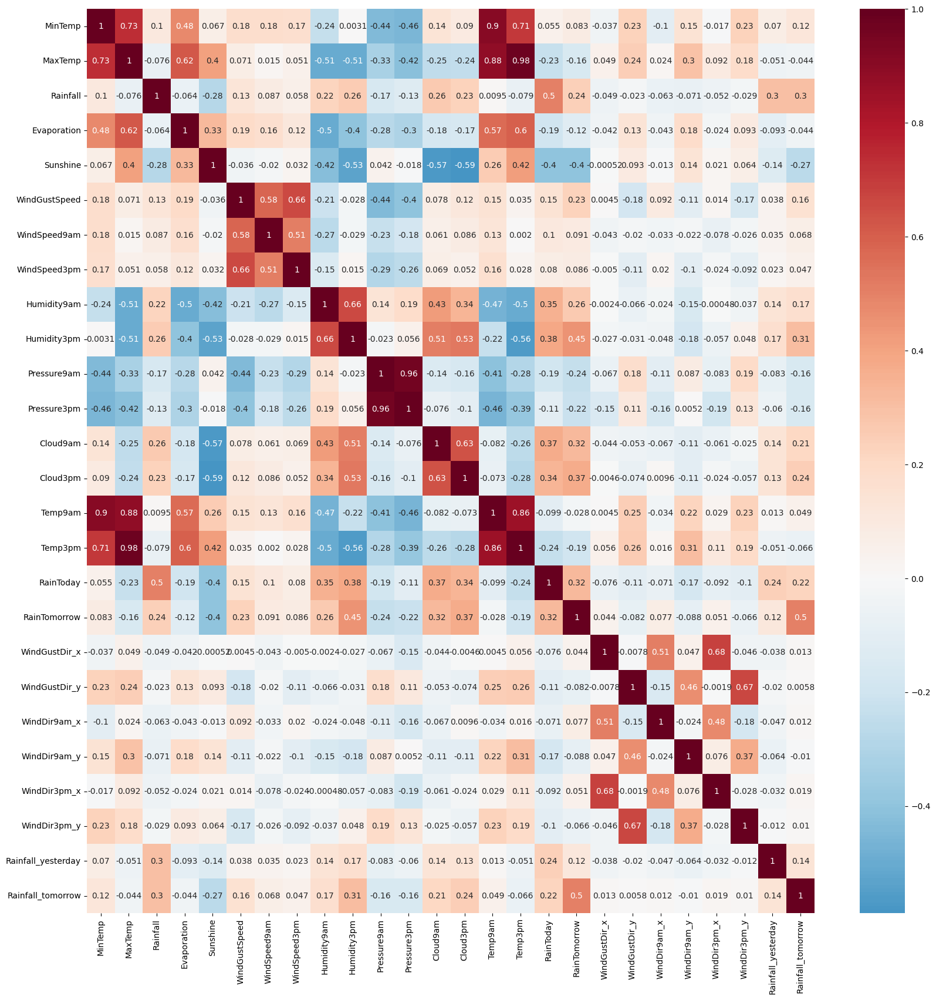

In [25]:
data_imp_enlarged_quant = data_imp_enlarged.drop(['Date', 'Location'], axis = 1)
plt.figure(figsize=(20,20))
sns.heatmap(data_imp_enlarged_quant.corr(),  annot=True, cmap="RdBu_r", center =0)
plt.show()

Pairplot for the most correlated variables for Rainfall Tomorrow.

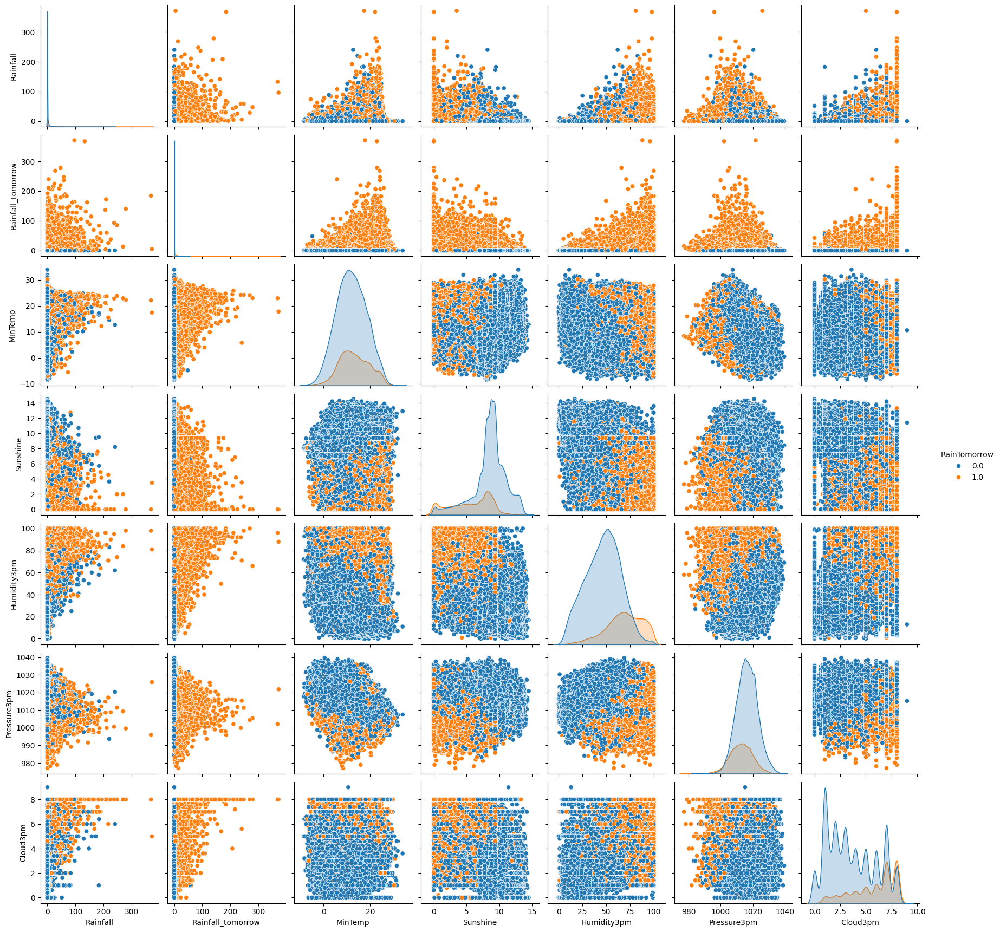

In [26]:
sns.pairplot(data=data_imp_enlarged, vars=('Rainfall', 'Rainfall_tomorrow', 'MinTemp', 'Sunshine', 'Humidity3pm', 'Pressure3pm', 'Cloud3pm'), hue='RainTomorrow')
plt.show()

###  Adding the month as a cyclic explanatory variables

In [27]:
data_imp_enlarged['month'] = pd.to_datetime(data_imp_enlarged['Date']).dt.month

In [30]:
date_to_angle = {12: 0, 1: np.pi/6, 2: (np.pi*2)/6, 3: (np.pi*3)/6, 
                      4: (np.pi*4)/6, 5: (np.pi*5)/6, 6: (np.pi*6)/6, 7: (np.pi*7)/6,
                      8: (np.pi*8)/6, 9: (np.pi*9)/6, 10: (np.pi*10)/6, 11: (np.pi*11)/6}
def circular_date_encode(direction):
    """
    The function encodes a variable with 12 different values as corresponding sin and cos values to capture the cyclic nature of the months
    """
    angle = date_to_angle[direction]
    return np.sin(angle), np.cos(angle)

In [31]:
data_imp_enlarged['month_x'] = data_imp_enlarged['month'].apply(lambda x: circular_date_encode(x)[1] if(pd.notnull(x)) else x)
data_imp_enlarged['month_y'] = data_imp_enlarged['month'].apply(lambda x: circular_date_encode(x)[0] if(pd.notnull(x)) else x)
print(data_imp_enlarged['month_x'].unique())

[ 1.00000000e+00  8.66025404e-01  5.00000000e-01  6.12323400e-17
 -5.00000000e-01 -8.66025404e-01 -1.00000000e+00 -8.66025404e-01
 -5.00000000e-01 -1.83697020e-16  8.66025404e-01]


In [32]:
data_imp_enlarged = data_imp_enlarged.drop(['month'], axis = 1)

## Building the final data set

In [34]:
data_final = data_imp_enlarged
data_final['Cluster'] = data_imp_cluster['Cluster_label']

data_final = data_final.drop(['Rainfall_yesterday', 'Rainfall_tomorrow'], axis = 1) #The added variables for Rainfall yesterday and Rainfall tomorrow as they are linked to the target variable Rain Tomorrow

print(data_final.info())

<class 'pandas.core.frame.DataFrame'>
Index: 142193 entries, 0 to 142192
Data columns (total 29 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   MinTemp        142193 non-null  float64
 1   MaxTemp        142193 non-null  float64
 2   Rainfall       142193 non-null  float64
 3   Evaporation    142193 non-null  float64
 4   Sunshine       142193 non-null  float64
 5   WindGustSpeed  142193 non-null  float64
 6   WindSpeed9am   142193 non-null  float64
 7   WindSpeed3pm   142193 non-null  float64
 8   Humidity9am    142193 non-null  float64
 9   Humidity3pm    142193 non-null  float64
 10  Pressure9am    142193 non-null  float64
 11  Pressure3pm    142193 non-null  float64
 12  Cloud9am       142193 non-null  float64
 13  Cloud3pm       142193 non-null  float64
 14  Temp9am        142193 non-null  float64
 15  Temp3pm        142193 non-null  float64
 16  RainToday      142193 non-null  float64
 17  RainTomorrow   142193 non-null  fl

In [35]:
data_final.to_csv('..\..\Data\weatherAUS_Agglomeration.csv', index = False)